# Zero-DCE++ with Channel Attention
## Low-Light Image Enhancement — Evaluation Notebook

**Novelty:** SE-Block (Channel Attention) after Conv3  
**Targets:** PSNR > 19 dB | SSIM > 0.65 | LPIPS < 0.30

In [1]:
import os
import numpy as np
import torch
import torch.nn as nn
from torch.utils.data import Dataset, DataLoader
import torchvision.transforms as transforms
from PIL import Image
import matplotlib.pyplot as plt
from pathlib import Path
from tqdm import tqdm
from skimage.metrics import structural_similarity as ssim_metric
from skimage.metrics import peak_signal_noise_ratio as psnr_metric
import warnings
warnings.filterwarnings('ignore')

device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print(f'Device: {device}')
if torch.cuda.is_available():
    print(f'GPU: {torch.cuda.get_device_name(0)}')

# Optional metrics
try:
    import lpips
    LPIPS_AVAILABLE = True
    lpips_model = lpips.LPIPS(net='alex', verbose=False).to(device)
    lpips_model.eval()
    print('LPIPS loaded')
except ImportError:
    LPIPS_AVAILABLE = False
    print('LPIPS not available — install with: pip install lpips')

try:
    import pyiqa
    # pyiqa exposes many IQA metrics via create_metric(metric_name, device=device)
    try:
        niqe_metric = pyiqa.create_metric('niqe', device=device)
        NIQE_AVAILABLE = True
        print('NIQE (pyiqa) loaded')
    except Exception as e:
        NIQE_AVAILABLE = False
        print("pyiqa installed but NIQE model not available via pyiqa.create_metric('niqe'). Try: pip install -U pyiqa or pip install git+https://github.com/chaofengc/IQA-PyTorch.git")
except ImportError:
    NIQE_AVAILABLE = False
    print('pyiqa not installed — install with: pip install pyiqa')


Device: cuda
GPU: NVIDIA GeForce RTX 3060
LPIPS loaded
pyiqa not installed — install with: pip install pyiqa


### Model Definition (must be identical to training)

In [2]:
class SEBlock(nn.Module):
    def __init__(self, channels, reduction=8):
        super(SEBlock, self).__init__()
        self.pool = nn.AdaptiveAvgPool2d(1)
        self.fc = nn.Sequential(
            nn.Linear(channels, channels // reduction, bias=False),
            nn.ReLU(inplace=True),
            nn.Linear(channels // reduction, channels, bias=False),
            nn.Sigmoid()
        )
    def forward(self, x):
        b, c, _, _ = x.shape
        w = self.pool(x).view(b, c)
        w = self.fc(w).view(b, c, 1, 1)
        return x * w

class DCENet(nn.Module):
    def __init__(self, use_attention=True):
        super(DCENet, self).__init__()
        self.use_attention = use_attention
        self.conv1 = nn.Conv2d(3,  32, 3, 1, 1)
        self.conv2 = nn.Conv2d(32, 32, 3, 1, 1)
        self.conv3 = nn.Conv2d(32, 32, 3, 1, 1)
        if use_attention:
            self.se = SEBlock(32, reduction=8)
        self.conv4 = nn.Conv2d(32, 32, 3, 1, 1)
        self.conv5 = nn.Conv2d(64, 32, 3, 1, 1)
        self.conv6 = nn.Conv2d(64, 32, 3, 1, 1)
        self.conv7 = nn.Conv2d(64, 24, 3, 1, 1)
        self.relu = nn.ReLU(inplace=True)

    def forward(self, x):
        x1 = self.relu(self.conv1(x))
        x2 = self.relu(self.conv2(x1))
        x3 = self.relu(self.conv3(x2))
        if self.use_attention:
            x3 = self.se(x3)
        x4 = self.relu(self.conv4(x3))
        x5 = self.relu(self.conv5(torch.cat([x4, x3], 1)))
        x6 = self.relu(self.conv6(torch.cat([x5, x2], 1)))
        x7 = torch.cat([x6, x1], 1)
        # FIX: tanh MUST be here — matches training notebook
        return torch.tanh(self.conv7(x7))

def enhance_image_with_curves(x, alpha):
    """Apply Zero-DCE curve: LE(x;a) = x + a*x*(1-x), 8 iterations"""
    enhanced = x.clone()
    for i in range(8):
        a_i = alpha[:, i*3:(i+1)*3, :, :]
        enhanced = enhanced + a_i * enhanced * (1 - enhanced)
    return torch.clamp(enhanced, 0, 1)

print('Model and curve function defined')


Model and curve function defined


### Dataset — Full Original Resolution (no forced resize)

In [3]:
class LOLDataset(Dataset):
    """
    Evaluation dataset: loads images at ORIGINAL resolution.
    No resizing or cropping — metrics must be on native pixels.
    """
    def __init__(self, image_pairs):
        self.image_pairs = image_pairs

    def __len__(self):
        return len(self.image_pairs)

    def __getitem__(self, idx):
        pair = self.image_pairs[idx]
        low_img    = Image.open(pair['low']).convert('RGB')
        normal_img = Image.open(pair['normal']).convert('RGB')
        low_tensor    = transforms.ToTensor()(low_img)
        normal_tensor = transforms.ToTensor()(normal_img)
        return {'low': low_tensor, 'normal': normal_tensor,
                'filename': pair['filename']}

def load_image_pairs(data_path):
    """
    FIX: LOL-v2 uses numeric filenames (1.png, 2.png...).
    .replace('low','normal') silently fails — pair by sorted order instead.
    """
    low_path    = data_path / 'Low'
    normal_path = data_path / 'Normal'
    low_images    = sorted([f for f in os.listdir(low_path)
                            if f.endswith(('.jpg', '.png'))])
    normal_images = sorted([f for f in os.listdir(normal_path)
                            if f.endswith(('.jpg', '.png'))])
    assert len(low_images) == len(normal_images), (
        f'Mismatch: {len(low_images)} low vs {len(normal_images)} normal'
    )
    pairs = []
    for low_f, normal_f in zip(low_images, normal_images):
        pairs.append({
            'low':      str(low_path    / low_f),
            'normal':   str(normal_path / normal_f),
            'filename': low_f
        })
    return pairs

print('Dataset helpers defined')


Dataset helpers defined


### Load Model and Test Data

In [4]:
CHECKPOINT = 'best_zerodce_seblock_v4.pth'  # update filename as needed
BASE_PATH  = Path('LOL-v2')

model = DCENet(use_attention=True).to(device)
model.load_state_dict(torch.load(CHECKPOINT, map_location=device))
model.eval()
print(f'Model loaded from: {CHECKPOINT}')
print(f'Parameters: {sum(p.numel() for p in model.parameters()):,}')

test_pairs  = load_image_pairs(BASE_PATH / 'Real_captured' / 'Test')
# batch_size=1 for full-resolution images (variable sizes won't stack otherwise)
test_dataset = LOLDataset(test_pairs)
test_loader  = DataLoader(test_dataset, batch_size=1, shuffle=False, num_workers=0)
print(f'Test set: {len(test_pairs)} images')


Model loaded from: best_zerodce_seblock_v4.pth
Parameters: 79,672
Test set: 100 images


### Evaluation Loop

In [5]:
test_metrics = {'psnr': [], 'ssim': [], 'lpips': [], 'niqe': []}
enhanced_images, low_images, normal_images, filenames = [], [], [], []

with torch.no_grad():
    pbar = tqdm(test_loader, desc='Evaluating')
    for batch in pbar:
        low_imgs    = batch['low'].to(device)
        normal_imgs = batch['normal'].to(device)

        alpha    = model(low_imgs)
        enhanced = enhance_image_with_curves(low_imgs, alpha)

        # ── Safety clamp: guarantee [0,1], no NaN or Inf ──────────
        enhanced = torch.clamp(enhanced, 0.0, 1.0)
        if torch.isnan(enhanced).any() or torch.isinf(enhanced).any():
            print(f"  WARNING: NaN/Inf in enhanced output for {batch['filename'][0]} — skipping")
            continue

        # ── numpy conversion (float32, no uint8) ──────────────────
        enh_np = enhanced.squeeze(0).cpu().permute(1, 2, 0).numpy()
        ref_np = normal_imgs.squeeze(0).cpu().permute(1, 2, 0).numpy()
        low_np = low_imgs.squeeze(0).cpu().permute(1, 2, 0).numpy()

        # ── PSNR / SSIM (always safe) ──────────────────────────────
        psnr_val = psnr_metric(ref_np, enh_np, data_range=1.0)
        ssim_val = ssim_metric(ref_np, enh_np, channel_axis=2, data_range=1.0)
        test_metrics['psnr'].append(psnr_val)
        test_metrics['ssim'].append(ssim_val)

        # ── LPIPS (guard against SVD failure on flat regions) ──────
        if LPIPS_AVAILABLE:
            try:
                # Add tiny noise to break degenerate flat regions
                enh_t = (enhanced * 2 - 1).clamp(-1, 1)
                ref_t = (normal_imgs * 2 - 1).clamp(-1, 1)
                enh_t = enh_t + torch.randn_like(enh_t) * 1e-6
                lp = lpips_model(enh_t, ref_t).item()
                test_metrics['lpips'].append(lp)
            except Exception as e:
                print(f"  LPIPS skipped for {batch['filename'][0]}: {type(e).__name__}")
                test_metrics['lpips'].append(float('nan'))

        # ── NIQE (guard against matrix errors too) ─────────────────
        if NIQE_AVAILABLE:
            try:
                niqe_score = niqe_metric(enhanced)
                niqe_val = niqe_score.item() if hasattr(niqe_score, 'item') else float(niqe_score)
                test_metrics['niqe'].append(niqe_val)
            except Exception as e:
                print(f"  NIQE skipped for {batch['filename'][0]}: {type(e).__name__}")
                test_metrics['niqe'].append(float('nan'))

        enhanced_images.append(enh_np)
        low_images.append(low_np)
        normal_images.append(ref_np)
        filenames.append(batch['filename'][0])

        pbar.set_postfix({'PSNR': f'{psnr_val:.2f}', 'SSIM': f'{ssim_val:.3f}'})

print('Evaluation complete!')

Evaluating: 100%|██████████| 100/100 [00:14<00:00,  7.09it/s, PSNR=16.10, SSIM=0.332]

Evaluation complete!


### Results Summary

In [6]:
import numpy as np

# ── Build metrics_info from whatever was collected ─────────────────────────
metrics_info = [
    ('PSNR (dB)', test_metrics['psnr'],  '> 19.00', 19.0, True),
    ('SSIM',      test_metrics['ssim'],  '> 0.65',  0.65, True),
]
if LPIPS_AVAILABLE and test_metrics['lpips']:
    metrics_info.append(('LPIPS', test_metrics['lpips'], '< 0.30', 0.30, False))
if NIQE_AVAILABLE and test_metrics['niqe']:
    metrics_info.append(('NIQE',  test_metrics['niqe'],  '< 3.80', 3.80, False))

# ── Print summary ──────────────────────────────────────────────────────────
print('\n' + '='*55)
print('FINAL EVALUATION RESULTS')
print('='*55)

for name, vals, target, thresh, higher_better in metrics_info:
    clean   = [v for v in vals if not np.isnan(v)]
    if not clean:
        print(f'\n{name}: all values were NaN — skipped')
        continue
    mean_v  = np.mean(clean)
    std_v   = np.std(clean)
    skipped = len(vals) - len(clean)
    passed  = mean_v > thresh if higher_better else mean_v < thresh
    status  = 'PASS' if passed else 'FAIL'
    print(f'\n{name}:')
    print(f'  Mean:    {mean_v:.4f}')
    print(f'  Std:     {std_v:.4f}')
    print(f'  Min:     {np.min(clean):.4f}')
    print(f'  Max:     {np.max(clean):.4f}')
    if skipped:
        print(f'  Skipped: {skipped} image(s) — NaN (SVD/metric error)')
    print(f'  Target:  {target}  →  [{status}]')

print('\n' + '='*55)


FINAL EVALUATION RESULTS

PSNR (dB):
  Mean:    12.3181
  Std:     3.5444
  Min:     6.0895
  Max:     18.1229
  Target:  > 19.00  →  [FAIL]

SSIM:
  Mean:    0.4574
  Std:     0.1114
  Min:     0.2357
  Max:     0.7916
  Target:  > 0.65  →  [FAIL]

LPIPS:
  Mean:    0.4779
  Std:     0.1123
  Min:     0.2573
  Max:     0.7155
  Target:  < 0.30  →  [FAIL]



### Metrics Distribution

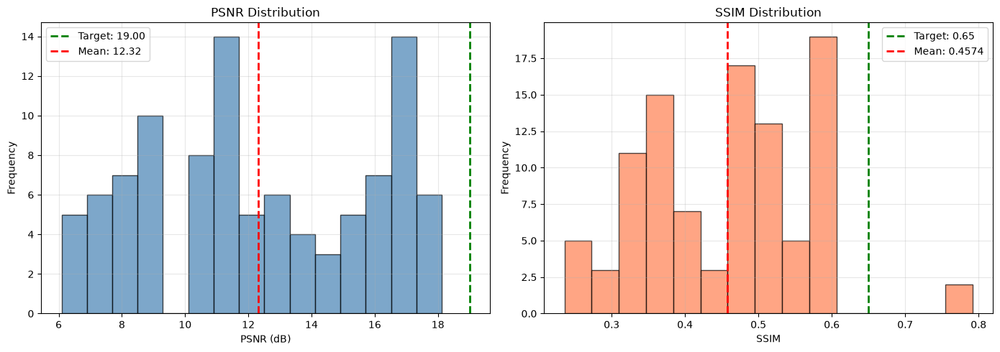

Saved: metrics_distribution.png


In [7]:
fig, axes = plt.subplots(1, 2, figsize=(14, 5))

axes[0].hist(test_metrics['psnr'], bins=15, edgecolor='black', alpha=0.7, color='steelblue')
axes[0].axvline(19, color='green', linestyle='--', linewidth=2, label='Target: 19.00')
axes[0].axvline(np.mean(test_metrics['psnr']), color='red', linestyle='--', linewidth=2,
                label=f"Mean: {np.mean(test_metrics['psnr']):.2f}")
axes[0].set_xlabel('PSNR (dB)'); axes[0].set_ylabel('Frequency')
axes[0].set_title('PSNR Distribution'); axes[0].legend(); axes[0].grid(True, alpha=0.3)

axes[1].hist(test_metrics['ssim'], bins=15, edgecolor='black', alpha=0.7, color='coral')
axes[1].axvline(0.65, color='green', linestyle='--', linewidth=2, label='Target: 0.65')
axes[1].axvline(np.mean(test_metrics['ssim']), color='red', linestyle='--', linewidth=2,
                label=f"Mean: {np.mean(test_metrics['ssim']):.4f}")
axes[1].set_xlabel('SSIM'); axes[1].set_ylabel('Frequency')
axes[1].set_title('SSIM Distribution'); axes[1].legend(); axes[1].grid(True, alpha=0.3)

plt.tight_layout()
plt.savefig('metrics_distribution.png', dpi=150)
plt.show()
print('Saved: metrics_distribution.png')


### Visual Comparison: Low-Light | Enhanced | Ground Truth

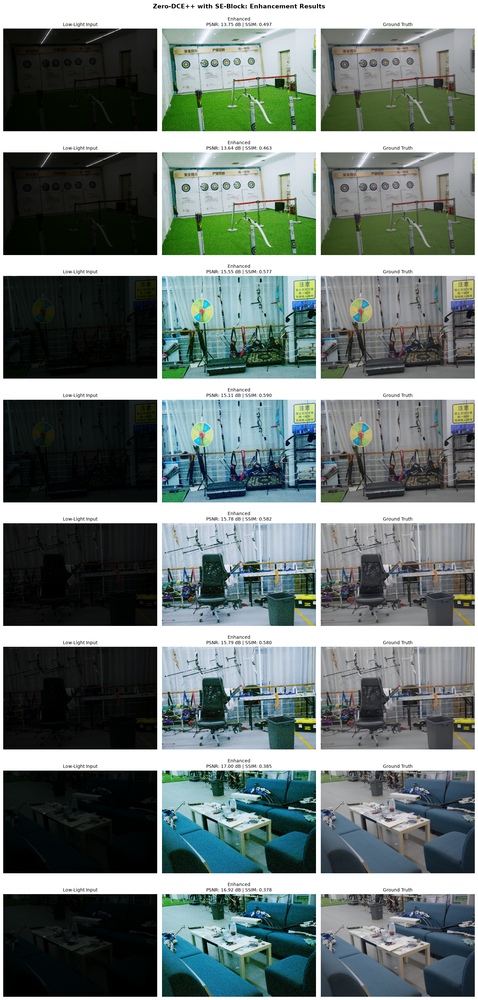

Saved: evaluation_results.png


In [8]:
num_show = min(8, len(enhanced_images))
fig, axes = plt.subplots(num_show, 3, figsize=(15, 4*num_show))

for idx in range(num_show):
    axes[idx, 0].imshow(np.clip(low_images[idx], 0, 1))
    axes[idx, 0].set_title('Low-Light Input', fontsize=10)
    axes[idx, 0].axis('off')

    axes[idx, 1].imshow(np.clip(enhanced_images[idx], 0, 1))
    p = test_metrics['psnr'][idx]
    s = test_metrics['ssim'][idx]
    axes[idx, 1].set_title(f'Enhanced\nPSNR: {p:.2f} dB | SSIM: {s:.3f}', fontsize=10)
    axes[idx, 1].axis('off')

    axes[idx, 2].imshow(np.clip(normal_images[idx], 0, 1))
    axes[idx, 2].set_title('Ground Truth', fontsize=10)
    axes[idx, 2].axis('off')

plt.suptitle('Zero-DCE++ with SE-Block: Enhancement Results\n\n', fontsize=14, fontweight='bold')
plt.tight_layout()
plt.savefig('evaluation_results.png', dpi=150, bbox_inches='tight')
plt.show()
print('Saved: evaluation_results.png')


### Per-Image Results Table

In [9]:
print(f"{'Filename':<25} {'PSNR':>8} {'SSIM':>8}" +
      (f" {'LPIPS':>8}" if LPIPS_AVAILABLE and test_metrics['lpips'] else '') + '\n' +
      '-'*55)
for i, fname in enumerate(filenames):
    lp_str = f"{test_metrics['lpips'][i]:>8.4f}" if LPIPS_AVAILABLE and test_metrics['lpips'] else ''
    print(f"{fname:<25} {test_metrics['psnr'][i]:>8.2f} {test_metrics['ssim'][i]:>8.4f}{lp_str}")
print('-'*55)
print(f"{'MEAN':<25} {np.mean(test_metrics['psnr']):>8.2f} {np.mean(test_metrics['ssim']):>8.4f}" +
      (f" {np.mean(test_metrics['lpips']):>8.4f}" if LPIPS_AVAILABLE and test_metrics['lpips'] else ''))


Filename                      PSNR     SSIM    LPIPS
-------------------------------------------------------
low00690.png                 13.75   0.4972  0.3353
low00691.png                 13.64   0.4630  0.3418
low00692.png                 15.55   0.5772  0.2946
low00693.png                 15.11   0.5901  0.2899
low00694.png                 15.78   0.5815  0.3109
low00695.png                 15.79   0.5799  0.3155
low00696.png                 17.00   0.3849  0.4662
low00697.png                 16.92   0.3782  0.4678
low00698.png                 17.95   0.3059  0.6440
low00699.png                 17.74   0.2898  0.6534
low00700.png                  8.67   0.5027  0.4513
low00701.png                  8.69   0.5088  0.4466
low00702.png                 17.03   0.4770  0.5513
low00703.png                 17.01   0.4760  0.5510
low00704.png                 16.96   0.4732  0.5493
low00705.png                 17.13   0.3743  0.6783
low00706.png                 16.74   0.3828  0.7020
low0070